# Data Visualisation
- Environment Setup
- Load Datasets and Utilities
- Feature Distribution
- Feature Comparison

### Environment setup

In [1]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
!wget https://downloads.rclone.org/v1.63.0/rclone-v1.63.0-linux-amd64.deb
!apt install ./rclone-v1.63.0-linux-amd64.deb
!rclone config
!sudo apt-get -y install fuse3

--2023-08-02 17:27:40--  https://downloads.rclone.org/v1.63.0/rclone-v1.63.0-linux-amd64.deb
Resolving downloads.rclone.org (downloads.rclone.org)... 95.217.6.16, 2a01:4f9:c012:7154::1
Connecting to downloads.rclone.org (downloads.rclone.org)|95.217.6.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 18373062 (18M) [application/vnd.debian.binary-package]
Saving to: ‘rclone-v1.63.0-linux-amd64.deb’

rclone-v1.63.0-linu 100%[===================>]  17.52M  10.1MB/s    in 1.7s    

2023-08-02 17:27:43 (10.1 MB/s) - ‘rclone-v1.63.0-linux-amd64.deb’ saved [18373062/18373062]

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Note, selecting 'rclone' instead of './rclone-v1.63.0-linux-amd64.deb'
The following NEW packages will be installed:
  rclone
0 upgraded, 1 newly installed, 0 to remove and 15 not upgraded.
Need to get 0 B/18.4 MB of archives.
After this operation, 56.7 MB of additional disk space will be used.
Get

In [3]:
!sudo mkdir /content/onedrive
!nohup rclone --vfs-cache-mode writes mount onedrive: /content/onedrive &

nohup: appending output to 'nohup.out'


### Load both 2017, 2018 original and improved CICIDS datasets

In [4]:
# Import Necessary Libraries
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt # plotting
import plotly.express as px
import seaborn as sns
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import glob
import time

from sklearn.manifold import TSNE


In [1]:
data_type = ['2017_original', '2017_corrected', '2018_original', '2018_corrected_sampling',
             '2017_original_resampling', '2017_corrected_resampling', '2018_original_resampling', '2018_corrected_sampling_resampling']

In [14]:
current_handle_data_type = data_type[3]

In [15]:
data = pd.read_parquet(f'/content/onedrive/data_{current_handle_data_type}.parquet')

CPU times: user 6.52 s, sys: 34.7 s, total: 41.2 s
Wall time: 5min 58s


In [5]:
feature_scores = pd.read_csv('/content/onedrive/features_scores.csv', names=['feature', 'importance ratio'], header=0)

In [6]:
feature_extract_item = list(feature_scores[feature_scores['importance ratio'] > 0.03]['feature'])
feature_extract_item

['Packet Length Std',
 'Bwd Packet Length Std',
 'Packet Length Variance',
 'Bwd Packet Length Mean',
 'Average Packet Size',
 'Bwd Packet Length Max',
 'Avg Bwd Segment Size',
 'Packet Length Mean',
 'Max Packet Length',
 'Subflow Bwd Bytes']

In [7]:
feature_scores_resampling = pd.read_csv('/content/onedrive/feature_scores_resampling.csv', names=['feature', 'importance ratio'], header = 0)

In [ ]:
feature_resampling_extract_item = list(feature_scores_resampling[feature_scores_resampling['importance ratio'] > 0.03]['feature'])
feature_resampling_extract_item.append('label_encoded')
feature_resampling_extract_item

## Feature Distribution

### 2017 original

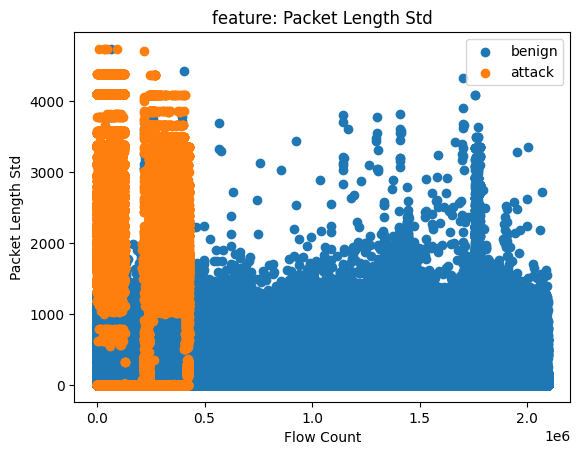

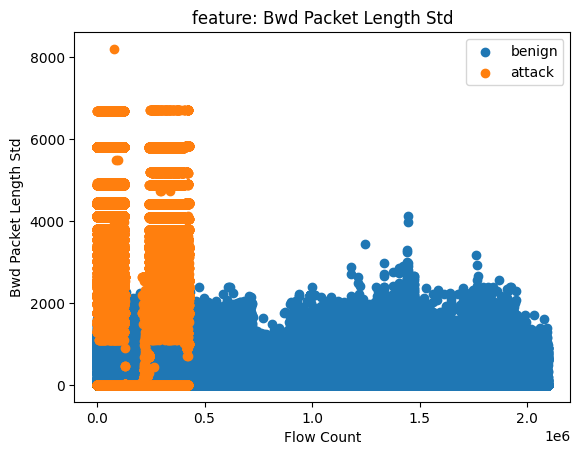

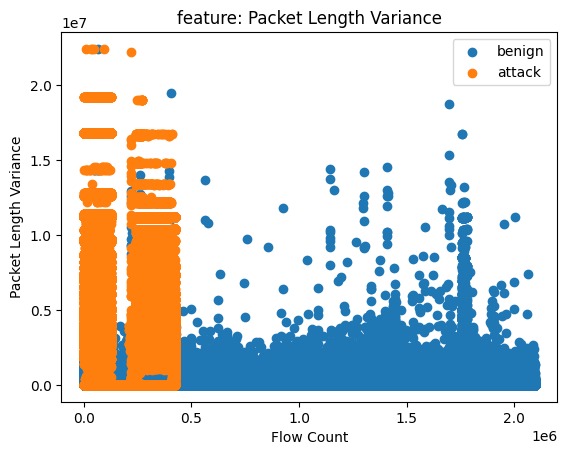

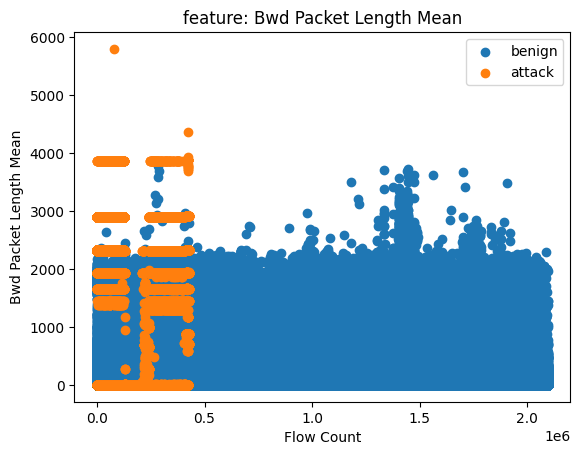

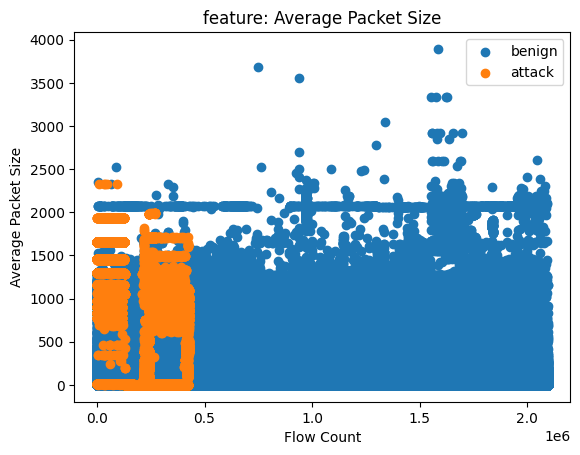

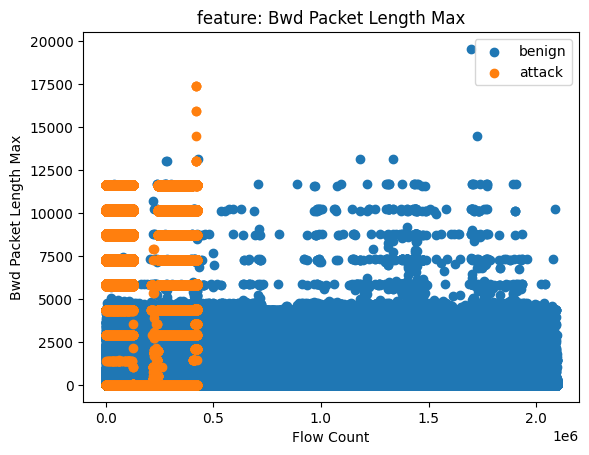

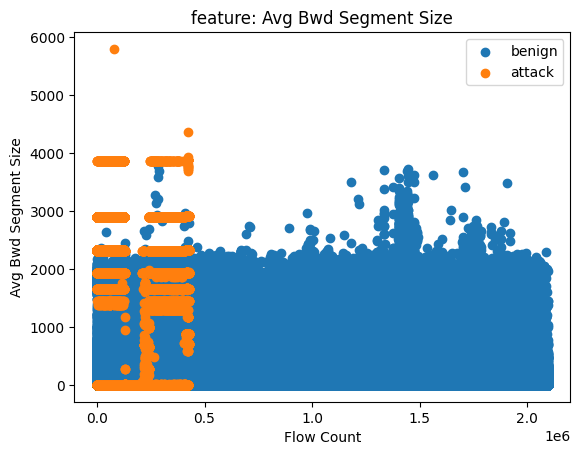

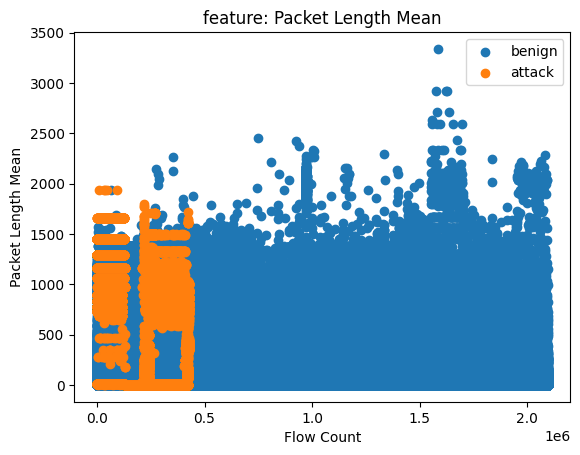

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


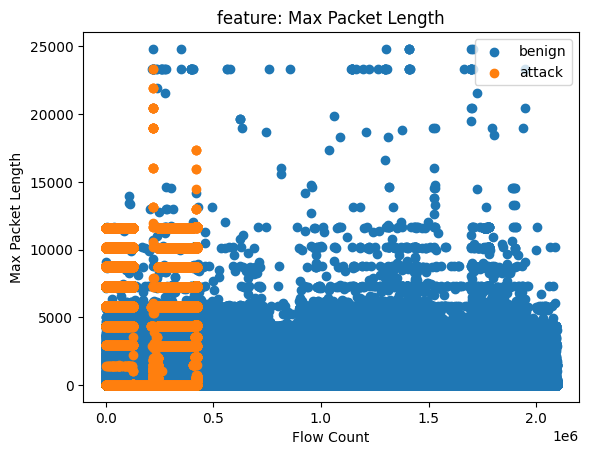

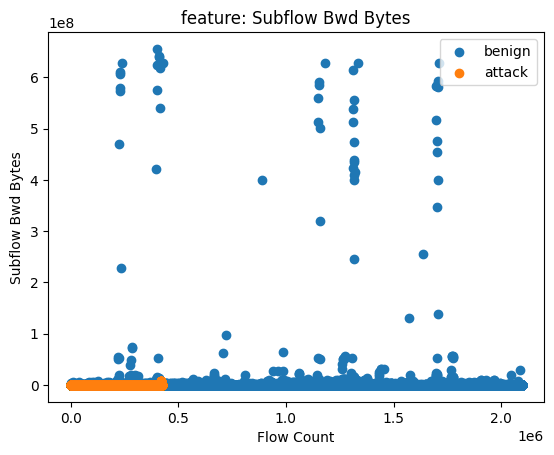

In [20]:
for feature in range(len(feature_extract_item)):
  plt.figure(f'{feature}')
  data_benign = data[data['label_encoded'] == 0]
  data_attack = data[data['label_encoded'] == 1]
  len_data_benign = len(data_benign)
  len_data_attack = len(data_attack)
  plt.scatter(range(len_data_benign), data_benign[feature_extract_item[feature]], label='benign')
  plt.scatter(range(len_data_attack), data_attack[feature_extract_item[feature]], label='attack')
  plt.xlabel('Flow Count')
  plt.ylabel(f'{feature_extract_item[feature]}')
  plt.legend()
  plt.title(f'feature: {feature_extract_item[feature]}')
  plt.show()

### 2017 improved

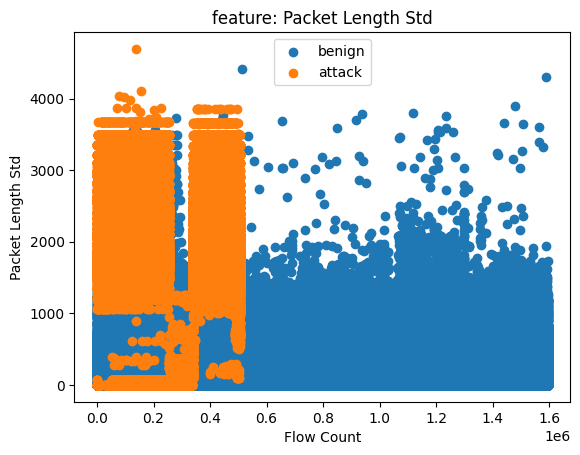

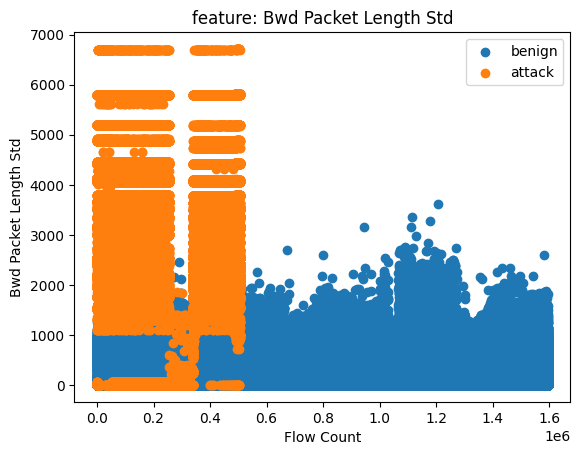

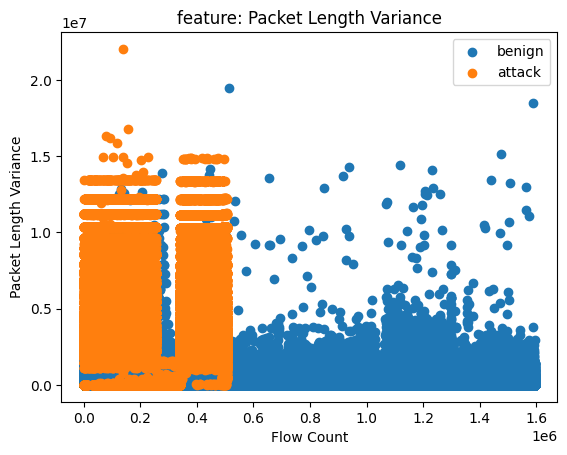

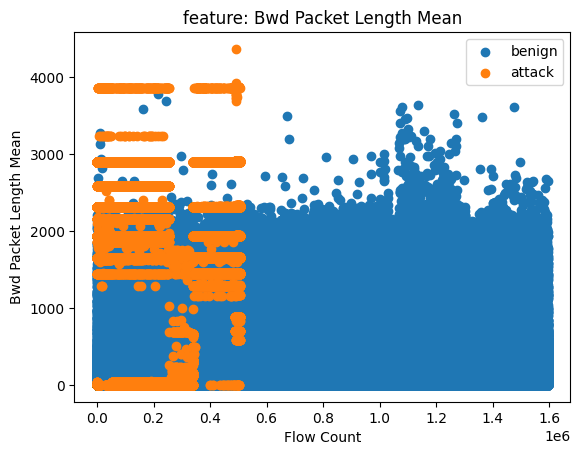

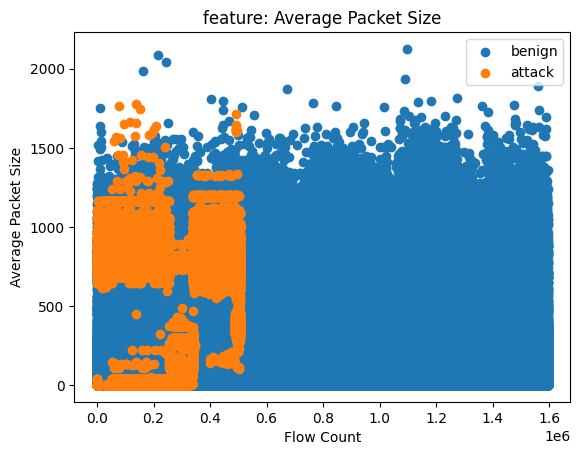

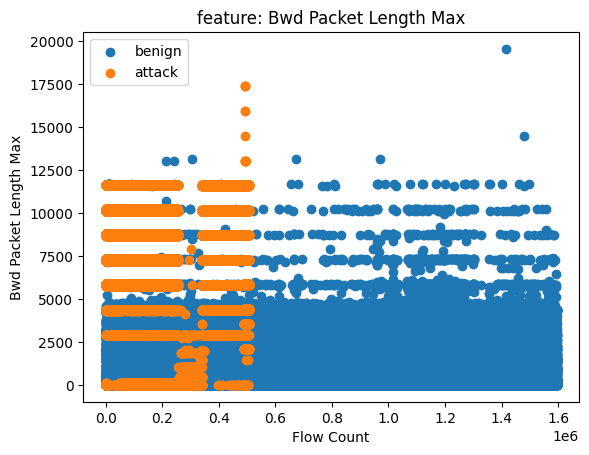

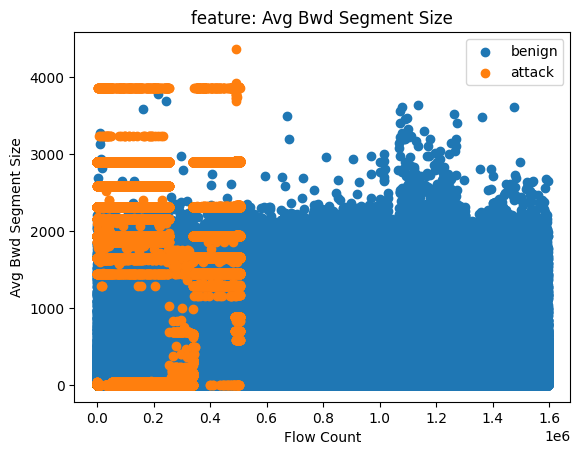

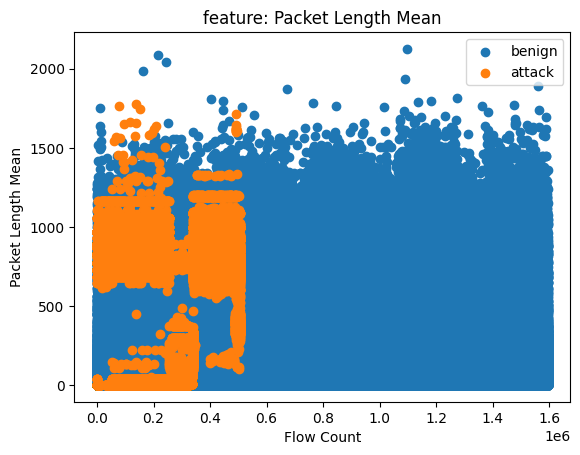

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


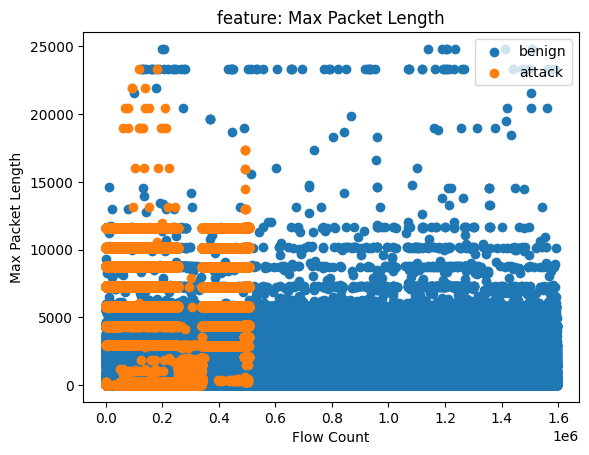

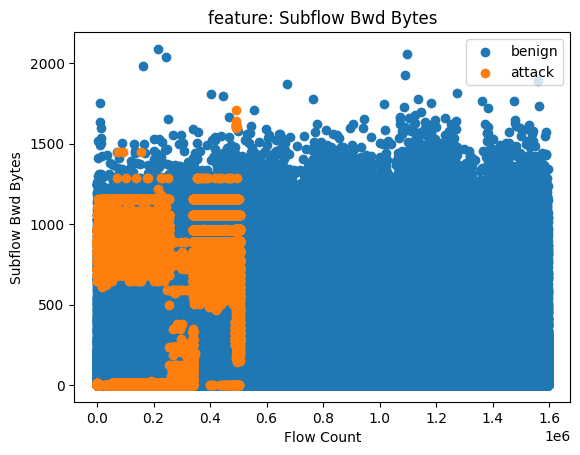

In [24]:
for feature in range(len(feature_extract_item)):
  plt.figure(f'{feature}')
  data_benign = data[data['label_encoded'] == 0]
  data_attack = data[data['label_encoded'] == 1]
  len_data_benign = len(data_benign)
  len_data_attack = len(data_attack)
  plt.scatter(range(len_data_benign), data_benign[feature_extract_item[feature]], label='benign')
  plt.scatter(range(len_data_attack), data_attack[feature_extract_item[feature]], label='attack')
  plt.xlabel('Flow Count')
  plt.ylabel(f'{feature_extract_item[feature]}')
  plt.legend()
  plt.title(f'feature: {feature_extract_item[feature]}')
  plt.show()

### 2018 original

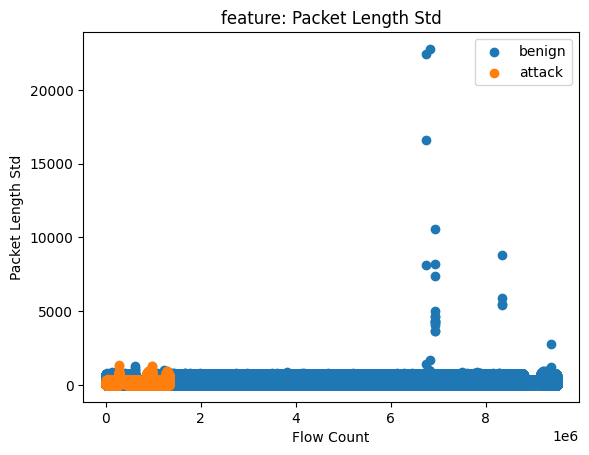

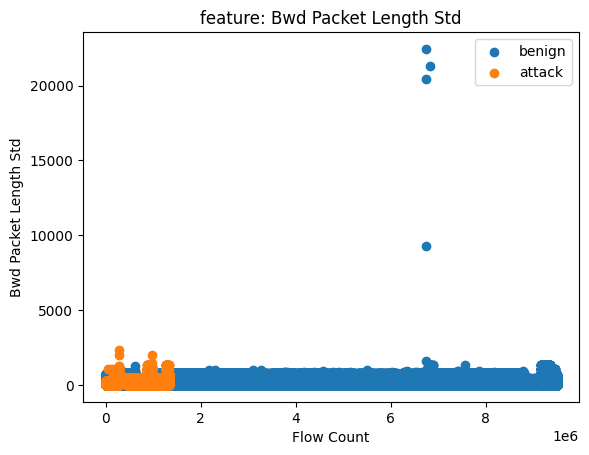

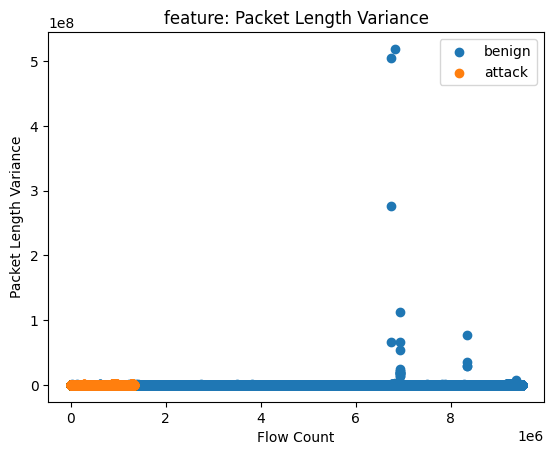

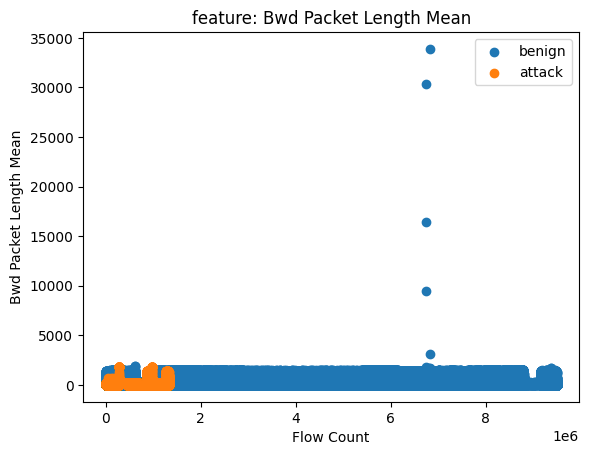

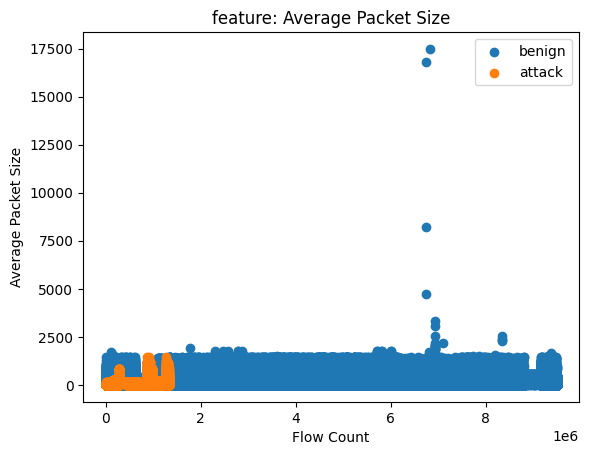

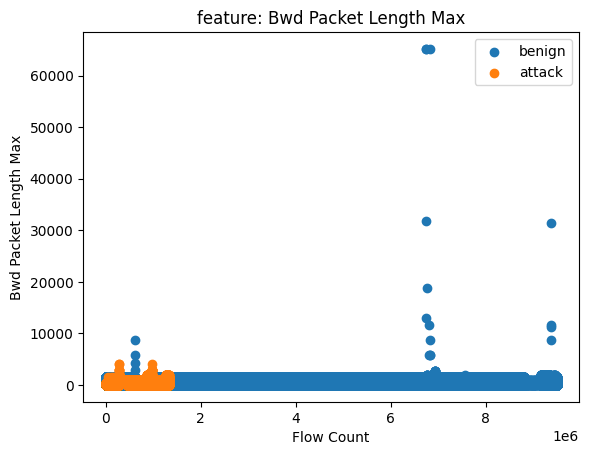

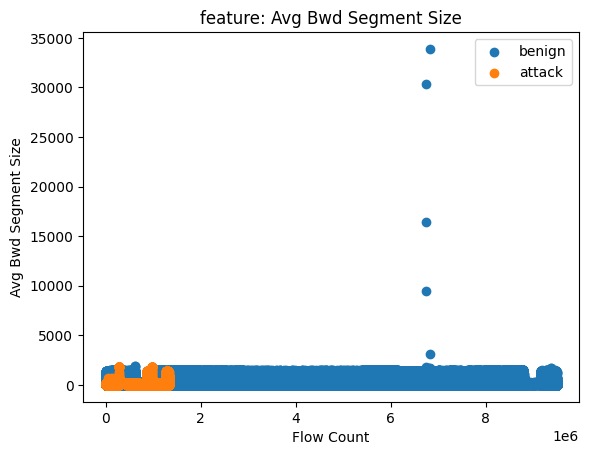

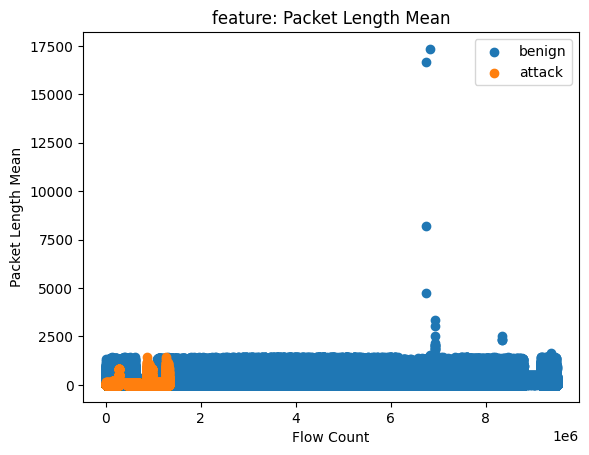

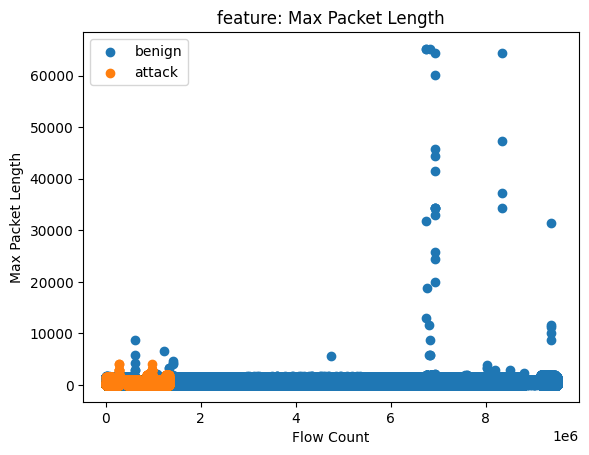

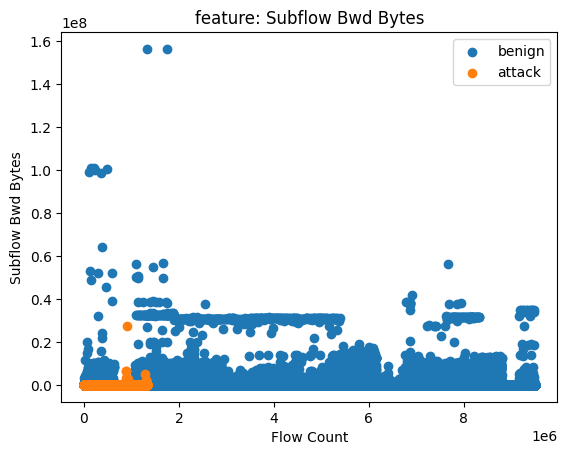

In [10]:
for feature in range(len(feature_extract_item)):
  plt.figure(f'{feature}')
  data_benign = data[data['label_encoded'] == 0]
  data_attack = data[data['label_encoded'] == 1]
  len_data_benign = len(data_benign)
  len_data_attack = len(data_attack)
  plt.scatter(range(len_data_benign), data_benign[feature_extract_item[feature]], label='benign')
  plt.scatter(range(len_data_attack), data_attack[feature_extract_item[feature]], label='attack')
  plt.xlabel('Flow Count')
  plt.ylabel(f'{feature_extract_item[feature]}')
  plt.legend()
  plt.title(f'feature: {feature_extract_item[feature]}')
  plt.show()

### 2018 improved

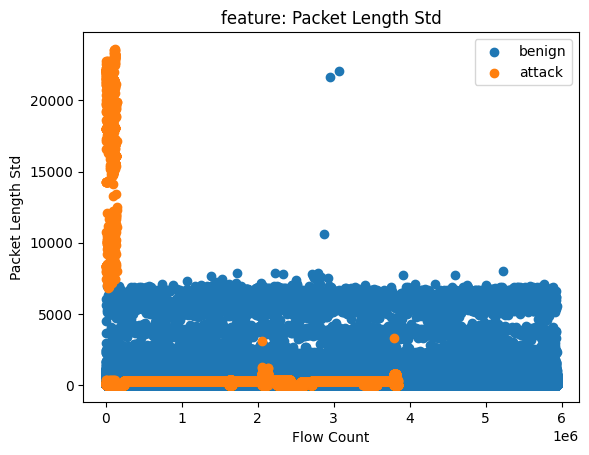

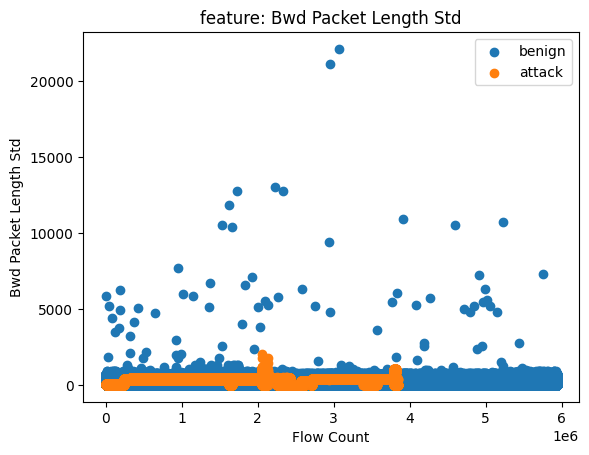

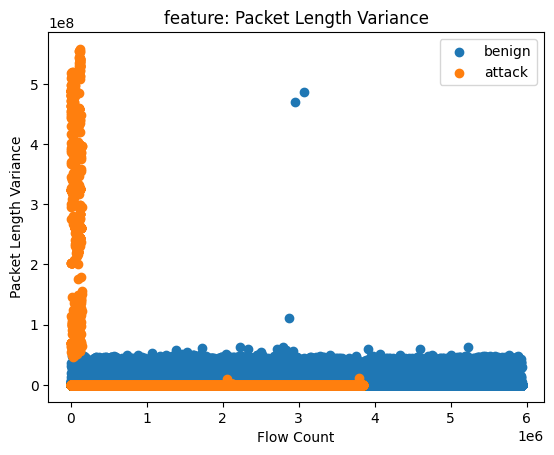

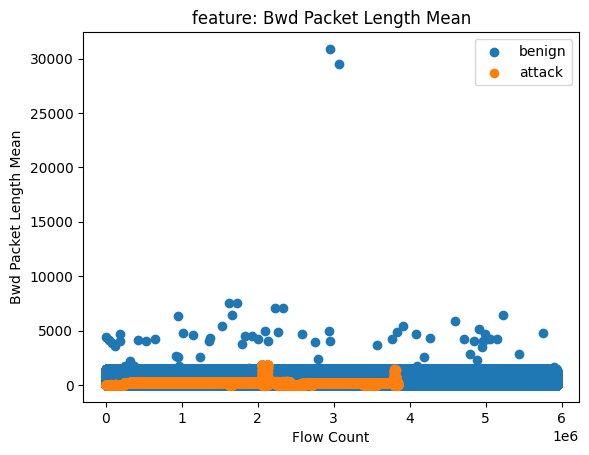

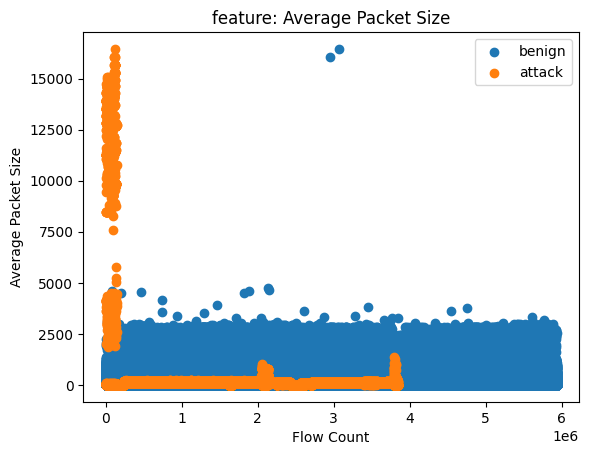

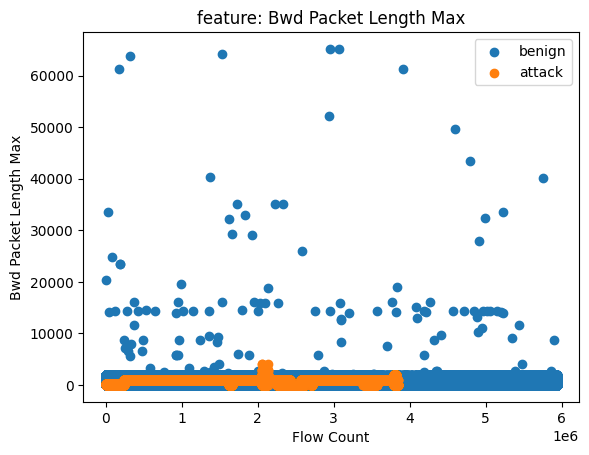

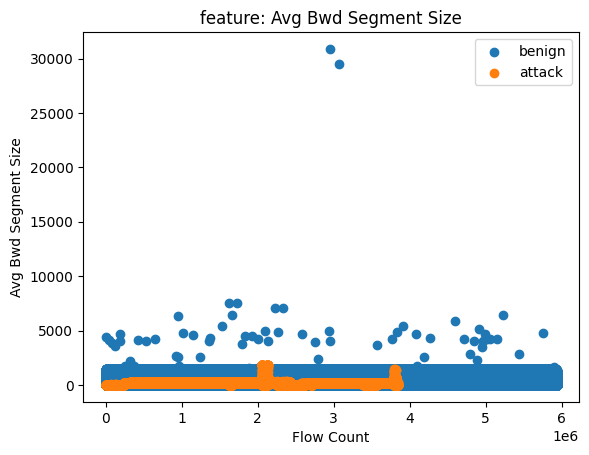

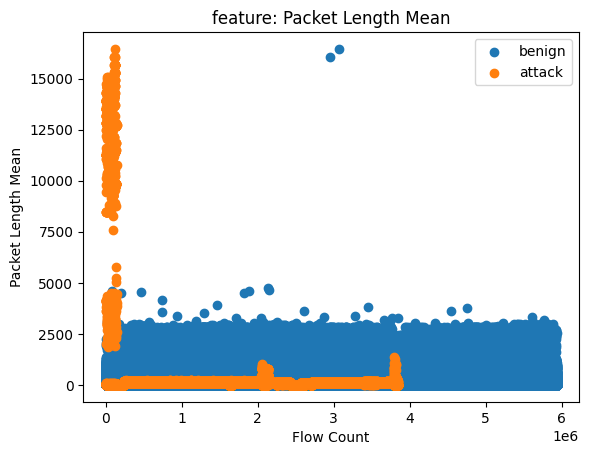

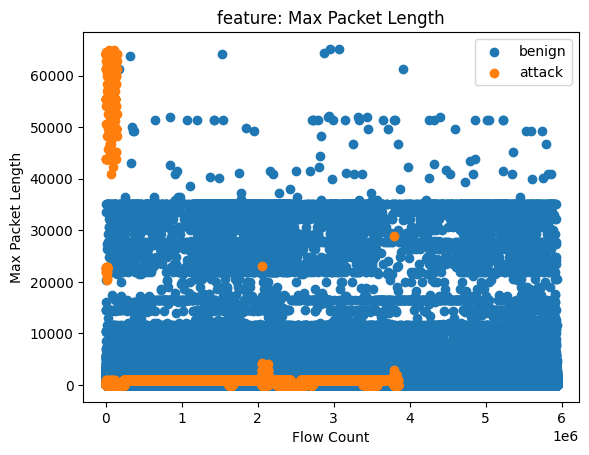

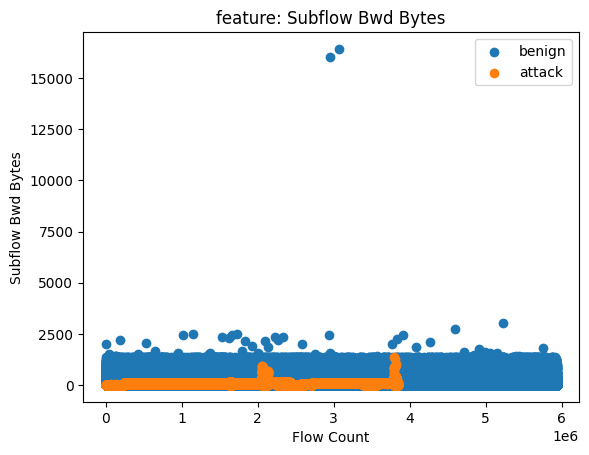

In [17]:
for feature in range(len(feature_extract_item)):
  plt.figure(f'{feature}')
  data_benign = data[data['label_encoded'] == 0]
  data_attack = data[data['label_encoded'] == 1]
  len_data_benign = len(data_benign)
  len_data_attack = len(data_attack)
  plt.scatter(range(len_data_benign), data_benign[feature_extract_item[feature]], label='benign')
  plt.scatter(range(len_data_attack), data_attack[feature_extract_item[feature]], label='attack')
  plt.xlabel('Flow Count')
  plt.ylabel(f'{feature_extract_item[feature]}')
  plt.legend()
  plt.title(f'feature: {feature_extract_item[feature]}')
  plt.show()

## Features comparison

### 2017 original

In [11]:
random_50000 = data.sample(50000)

<ipython-input-39-4d82f412a441>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(f'{feature_i} {feature_j}')


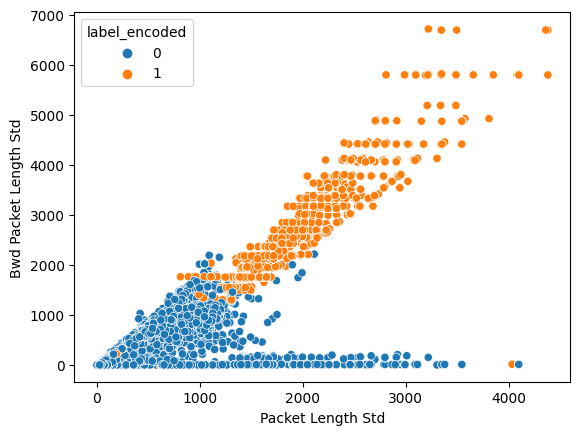

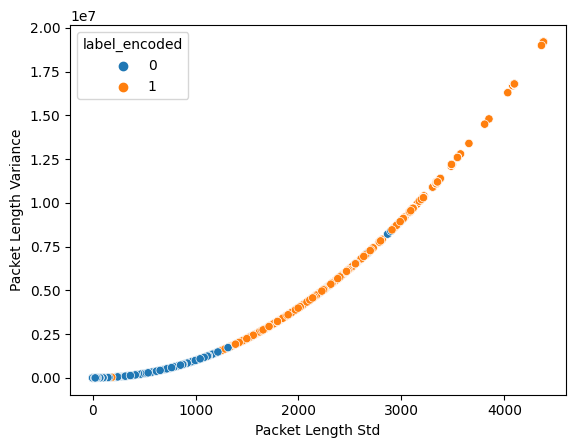

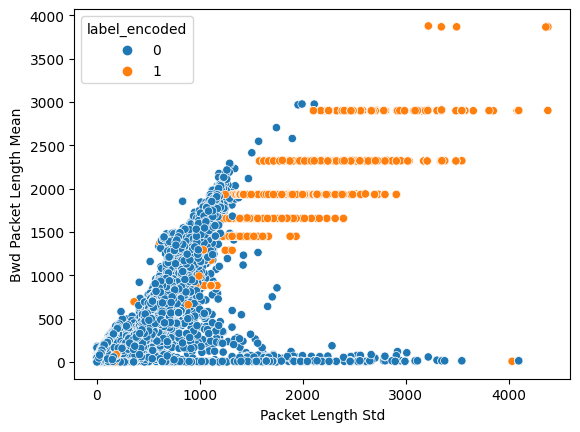

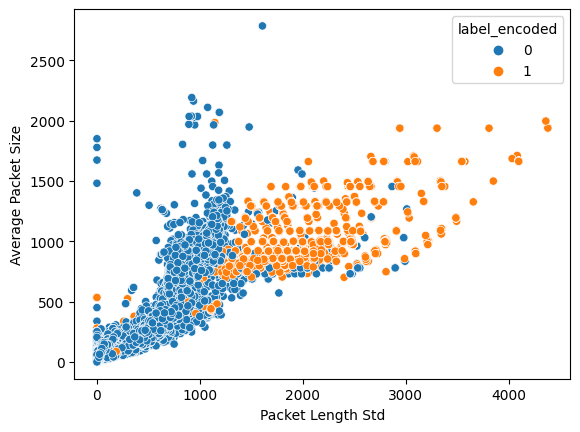

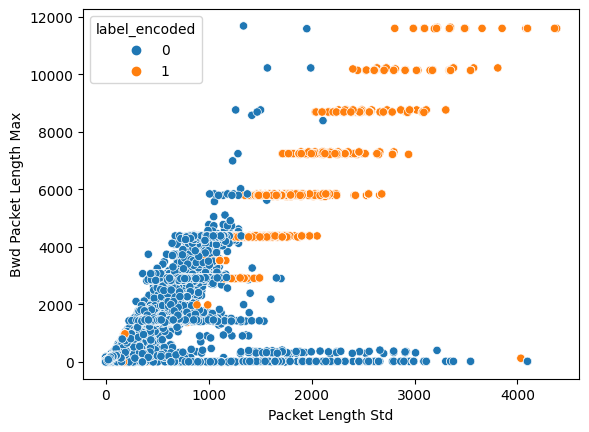

...

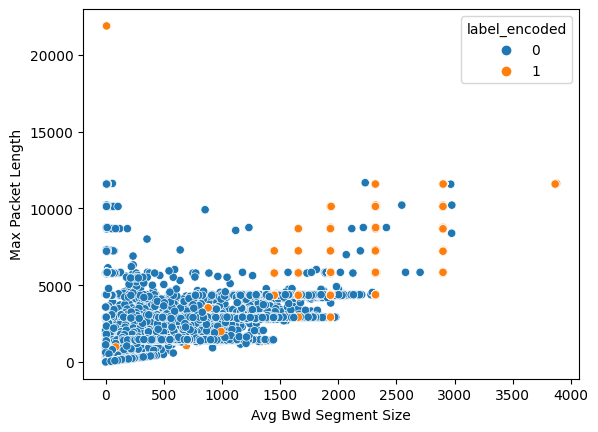

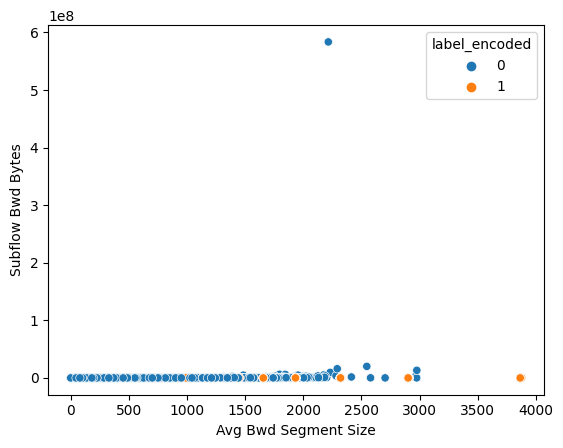

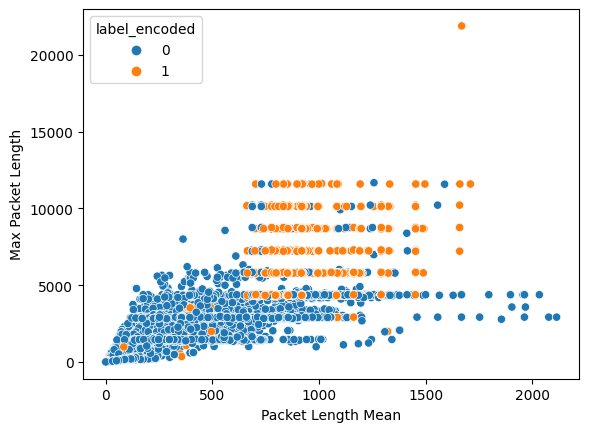

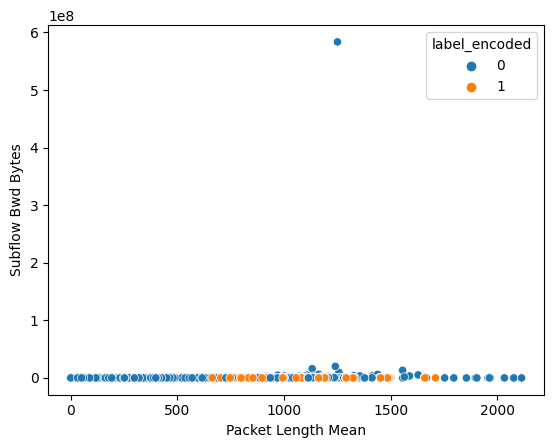

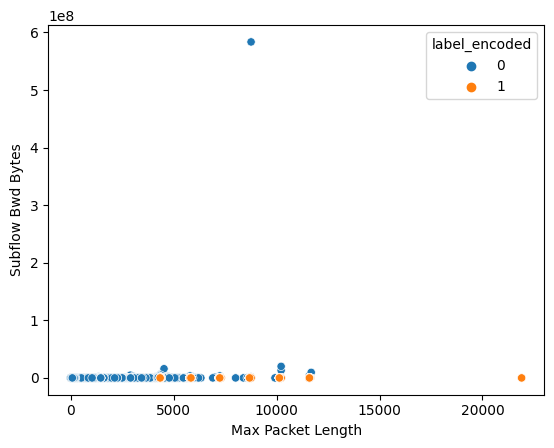

In [39]:
for feature_i in range(len(feature_extract_item)):
  for feature_j in range(feature_i+1, len(feature_extract_item)):
    plt.figure(f'{feature_i} {feature_j}')
    sns.scatterplot(x=random_50000[feature_extract_item[feature_i]],
                    y=random_50000[feature_extract_item[feature_j]],
                    hue='label_encoded',
                    data=random_50000)

### 2017 improved

<ipython-input-33-4d82f412a441>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(f'{feature_i} {feature_j}')


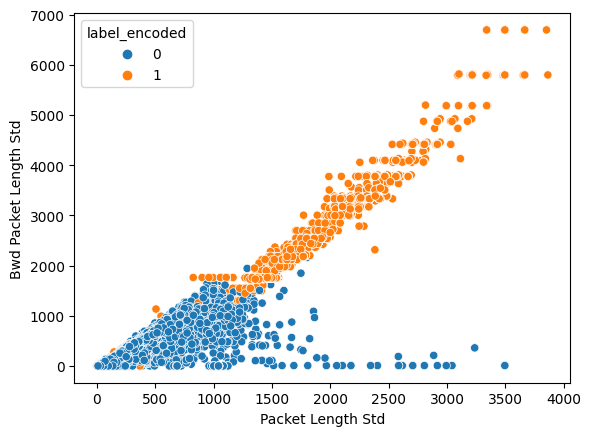

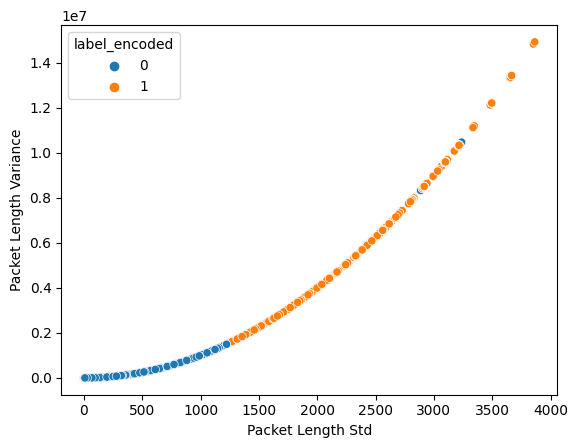

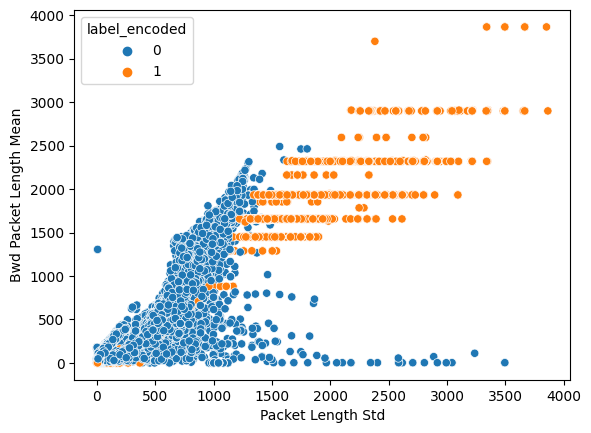

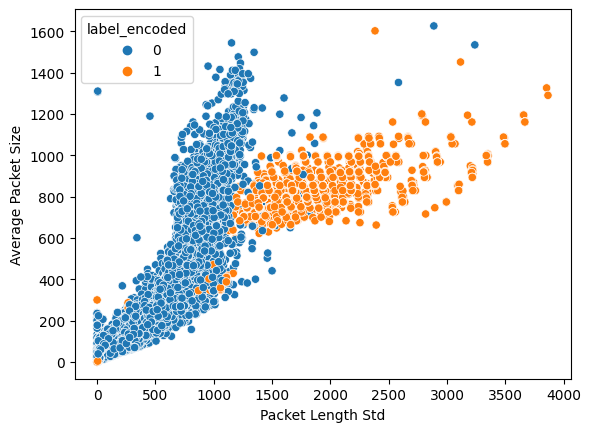

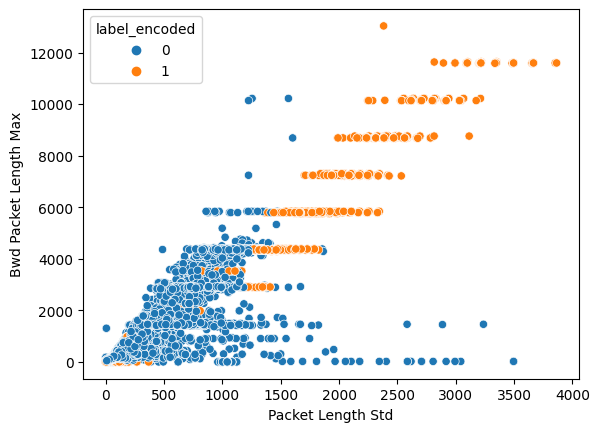

...

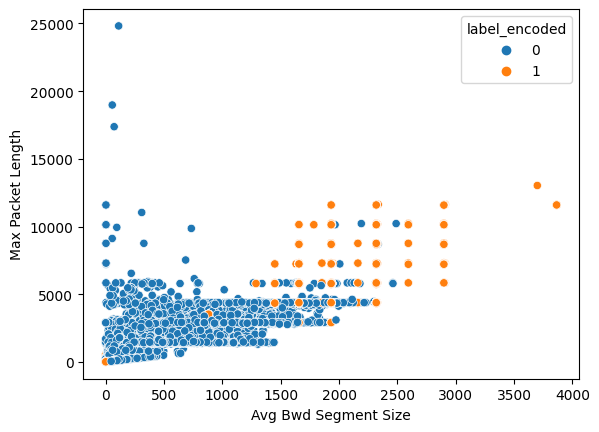

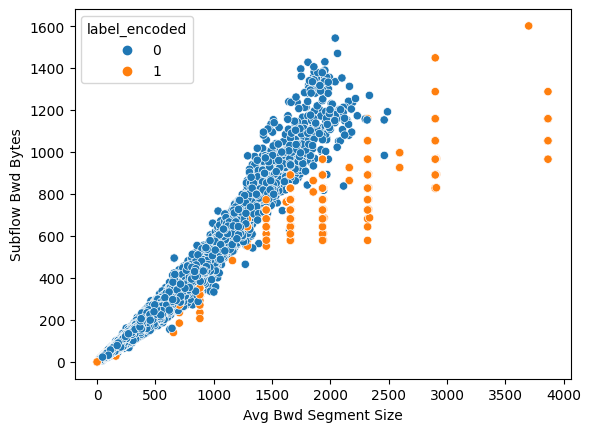

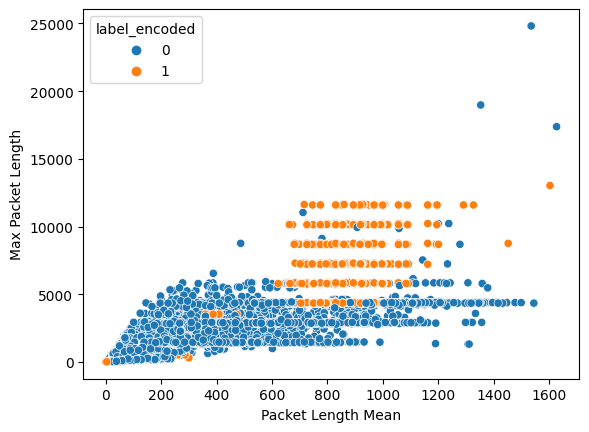

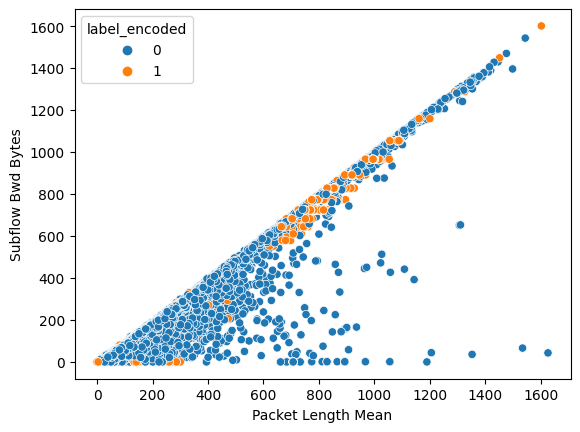

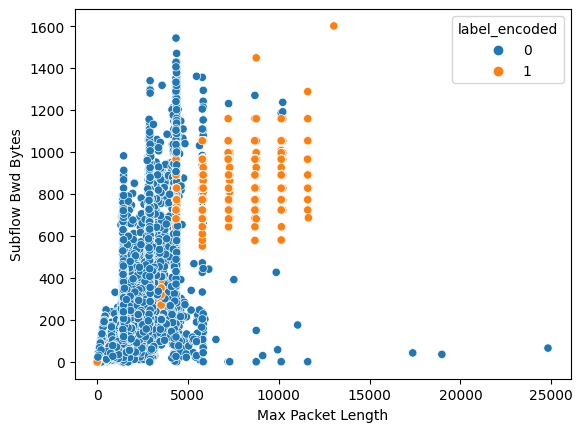

In [33]:
for feature_i in range(len(feature_extract_item)):
  for feature_j in range(feature_i+1, len(feature_extract_item)):
    plt.figure(f'{feature_i} {feature_j}')
    sns.scatterplot(x=random_50000[feature_extract_item[feature_i]],
                    y=random_50000[feature_extract_item[feature_j]],
                    hue='label_encoded',
                    data=random_50000)

### 2018 original

<ipython-input-12-4d82f412a441>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(f'{feature_i} {feature_j}')


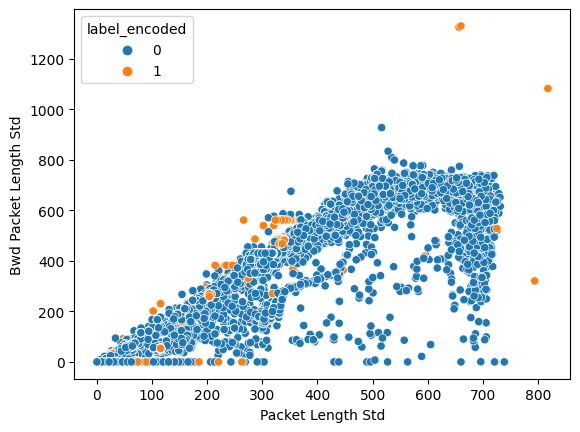

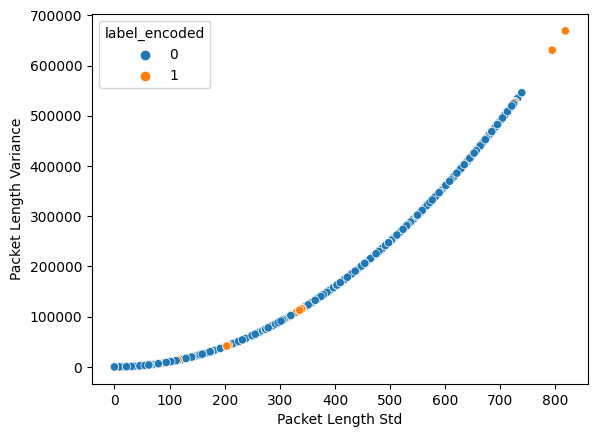

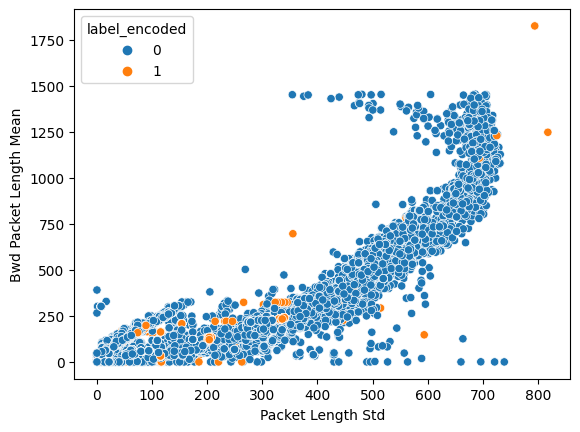

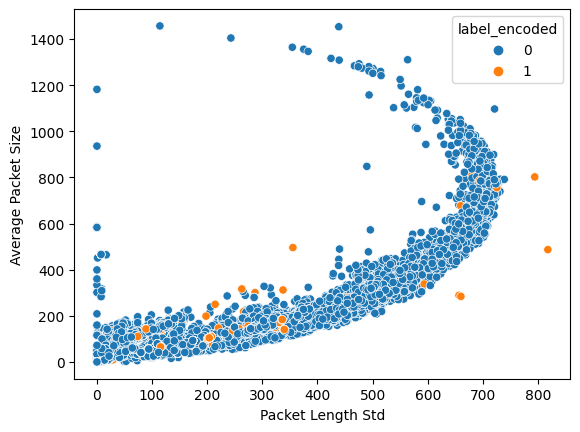

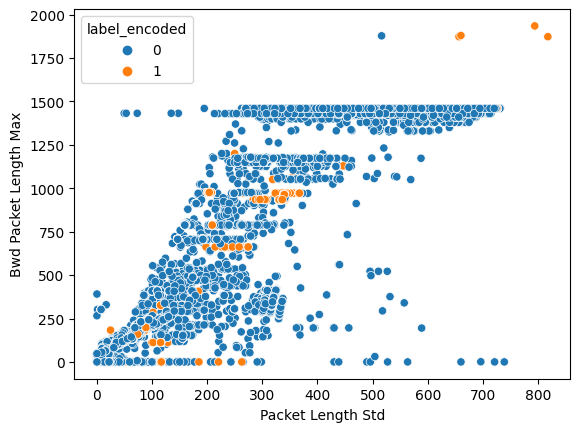

...

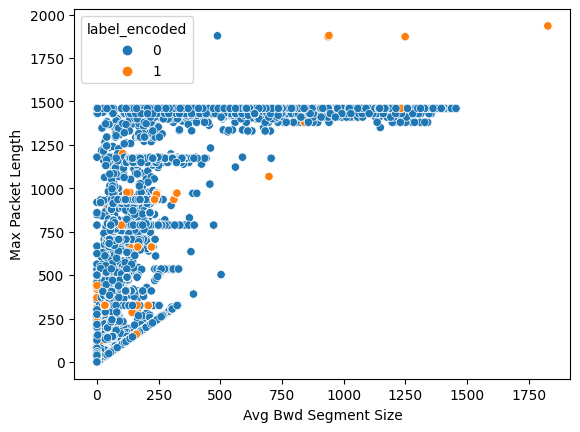

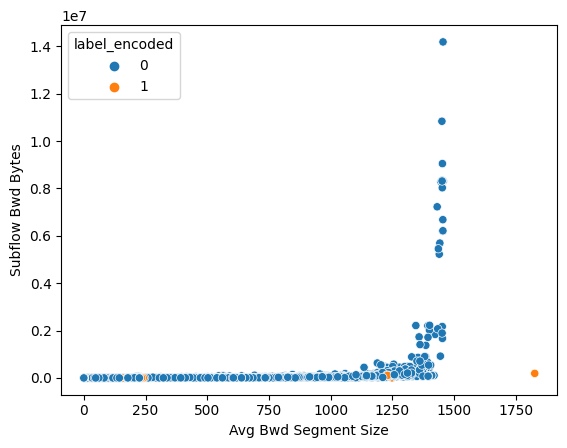

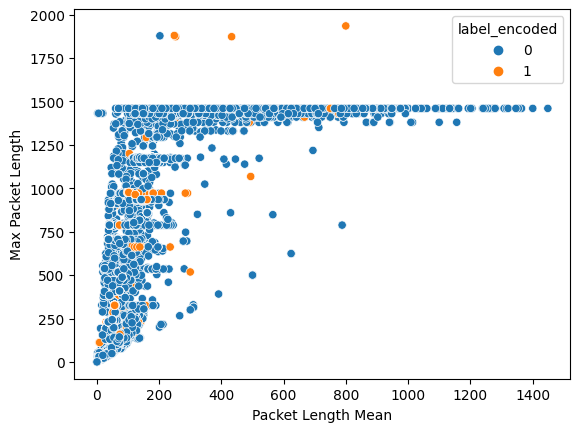

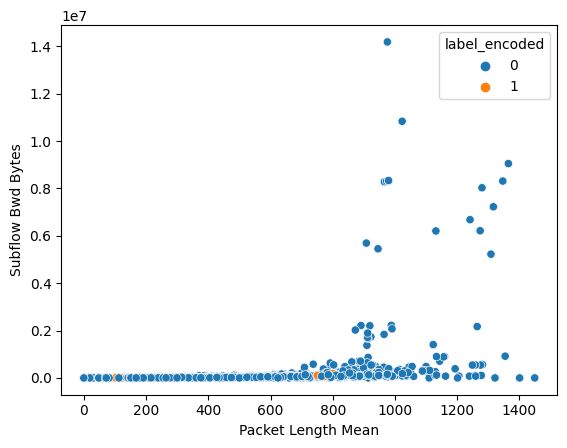

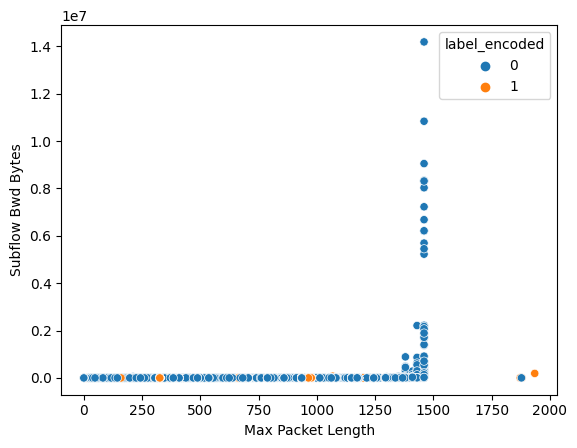

In [12]:
for feature_i in range(len(feature_extract_item)):
  for feature_j in range(feature_i+1, len(feature_extract_item)):
    plt.figure(f'{feature_i} {feature_j}')
    sns.scatterplot(x=random_50000[feature_extract_item[feature_i]],
                    y=random_50000[feature_extract_item[feature_j]],
                    hue='label_encoded',
                    data=random_50000)

### 2018 improved

<ipython-input-21-4d82f412a441>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(f'{feature_i} {feature_j}')


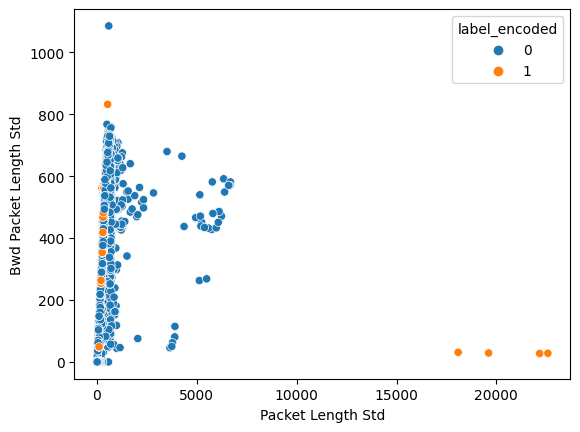

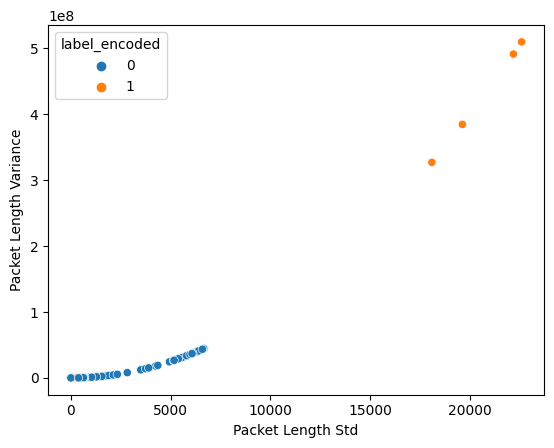

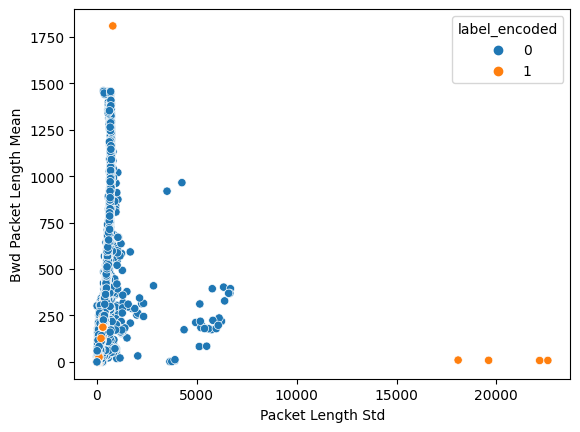

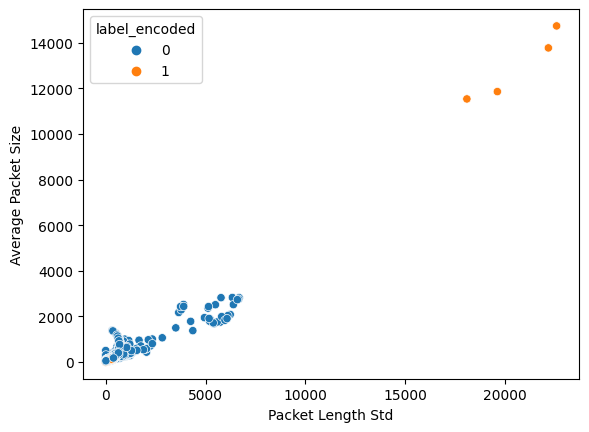

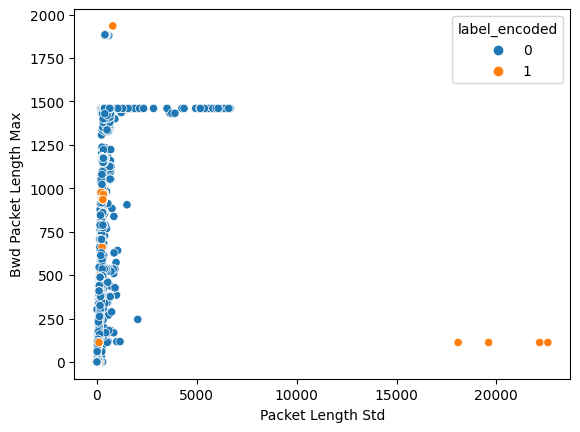

...

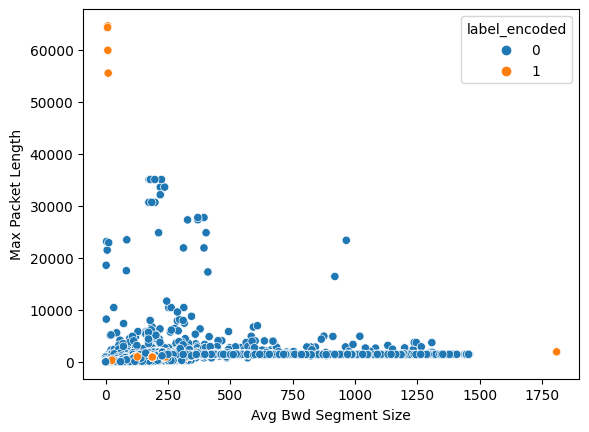

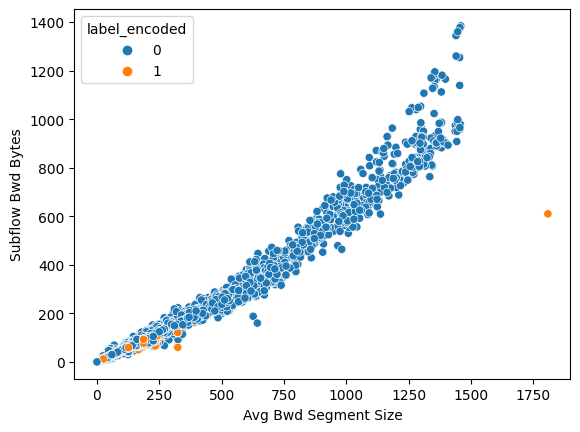

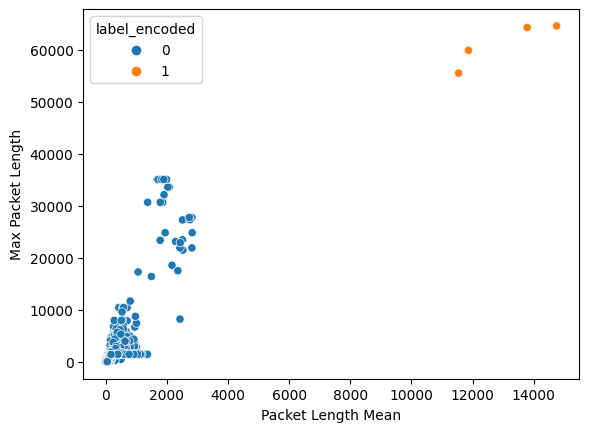

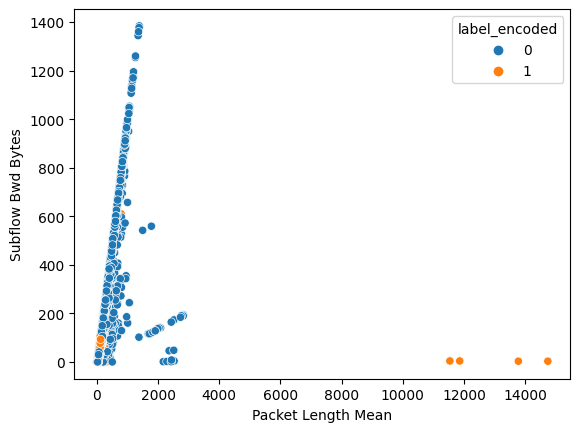

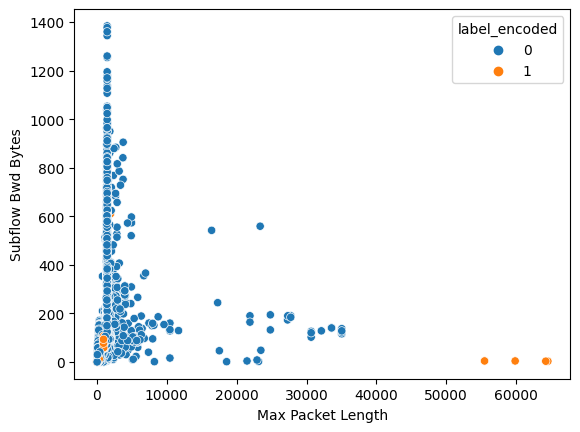

In [21]:
for feature_i in range(len(feature_extract_item)):
  for feature_j in range(feature_i+1, len(feature_extract_item)):
    plt.figure(f'{feature_i} {feature_j}')
    sns.scatterplot(x=random_50000[feature_extract_item[feature_i]],
                    y=random_50000[feature_extract_item[feature_j]],
                    hue='label_encoded',
                    data=random_50000)

### TSNE

In [16]:
def tsne_plot(x):

    # Setting the plotting background
    sns.set(style ="whitegrid")

    tsne = TSNE(n_components = 2, random_state = 0)

    # Reducing the dimensionality of the data
    X_transformed = tsne.fit_transform(x)

    return X_transformed

In [ ]:
current_handle_data_type = data_type[3]

In [17]:
del data
gc.collect()

8576

In [18]:
data = pd.read_parquet('/content/onedrive/test_result/data_test_2017_original.parquet')
if current_handle_data_type == data_type[1]:
  data = pd.read_parquet('/content/onedrive/test_result/data_test_2017_corrected.parquet')
elif current_handle_data_type == data_type[2]:
  data = pd.read_parquet('/content/onedrive/test_result/data_test_2018_original.parquet')
elif current_handle_data_type == data_type[3]:
  data = pd.read_parquet('/content/onedrive/test_result/data_test_2018_corrected.parquet')

In [ ]:
data.head()

,Packet Length Std,Bwd Packet Length Std,Packet Length Variance,Bwd Packet Length Mean,Average Packet Size,Bwd Packet Length Max,Avg Bwd Segment Size,Packet Length Mean,Max Packet Length,Subflow Bwd Bytes,label_encoded,ypreds_rf,ypreds_xgb,ypreds_knn
0,12.500000,0.000000,156.250,0.000,16.333333,0,0.000,12.250000,31,0,0,0,0,0
1,3.000000,0.000000,9.000,0.000,2.000000,0,0.000,1.500000,6,0,0,0,0,0
2,19.869575,0.000000,394.800,6.000,20.500000,6,6.000,16.400000,38,6,0,0,0,0
3,1564.377904,1894.680443,2447278.225,1449.375,921.769231,4344,1449.375,855.928571,4344,11595,1,1,1,1
4,2.190890,0.000000,4.800,6.000,4.500000,6,6.000,3.600000,6,12,0,0,0,0


In [19]:
def is_misclassified(df, method):
  if method == 'rf':
    df['error_rf'] = df['label_encoded'] != df['ypreds_rf']

  return df

In [20]:
data = is_misclassified(data, 'rf')

In [21]:
X_data = data.loc[:, 'Packet Length Std':'Subflow Bwd Bytes']

In [22]:
X_transformed = tsne_plot(X_data)

In [23]:
X_transformed = pd.DataFrame(X_transformed)

In [24]:
X_transformed['error_rf'] = data['error_rf']
X_transformed['label_encoded'] = data['label_encoded']

In [ ]:
X_transformed.to_csv('2017_data_test_result.csv')

In [ ]:
X_transformed.to_csv('2017_improved_data_test_result.csv')

In [ ]:
X_transformed.to_csv('/content/onedrive/vis/2018_original_data_test_result.csv')

In [25]:
X_transformed.to_csv('/content/onedrive/vis/2018_improved_data_test_result.csv')

In [ ]:
X_transformed.columns

Index([0, 1, 'error_rf', 'label_encoded'], dtype='object')

### 2017 original

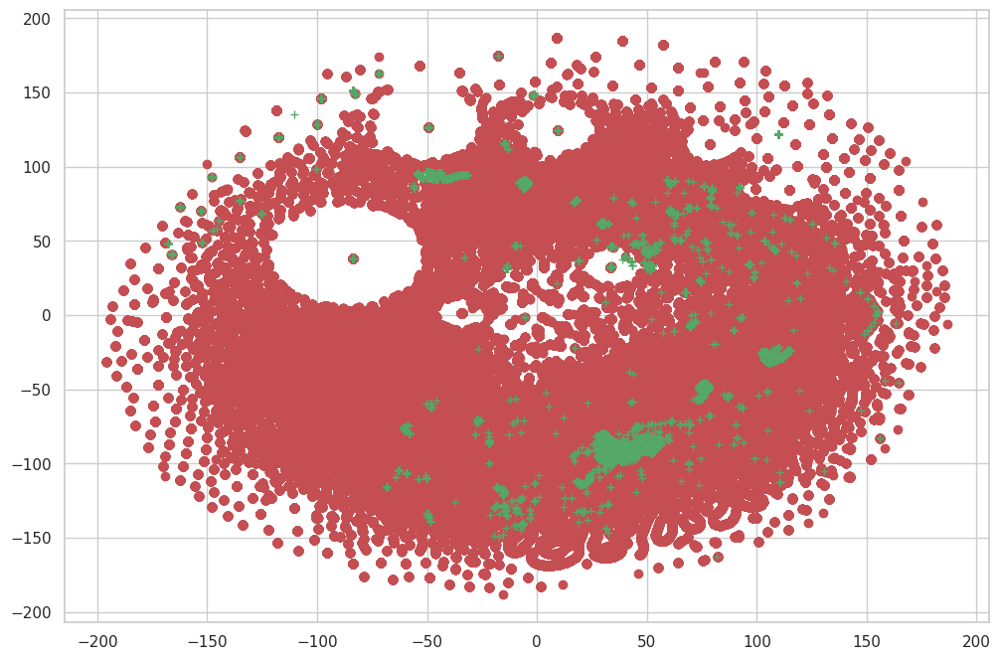

In [ ]:
marks = ('ro', 'g+')

plt.figure(figsize =(12, 8))

y = data['error_rf']

for n in range(0, 2, 1) :
    projClass = X_transformed[np.equal(y, n*np.ones(y.shape))]
    plt.plot(projClass[:,0], projClass[:,1], marks[n])

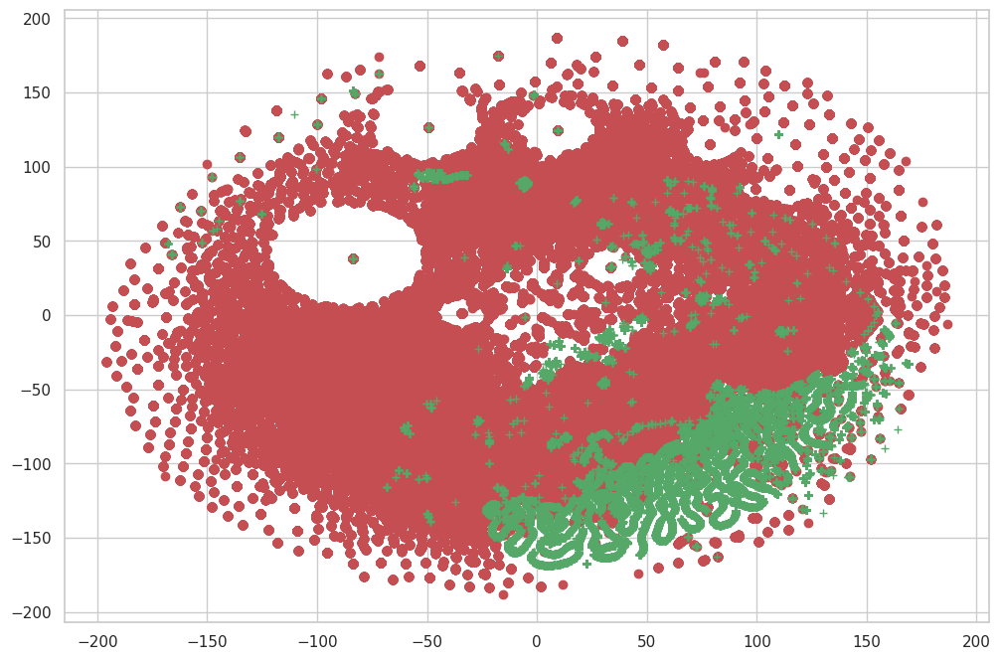

In [ ]:
marks = ('ro', 'g+')

plt.figure(figsize =(12, 8))

y = data['label_encoded']

for n in range(0, 2, 1) :
    projClass = X_transformed[np.equal(y, n*np.ones(y.shape))]
    plt.plot(projClass[0], projClass[1], marks[n])

### 2017 improved

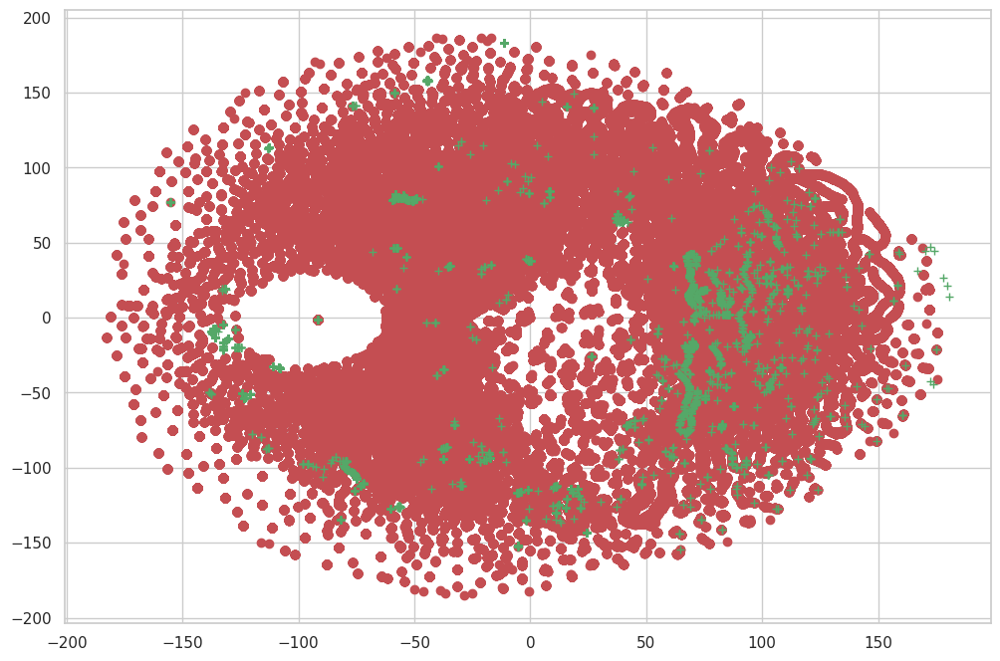

In [ ]:
marks = ('ro', 'g+')

plt.figure(figsize =(12, 8))

y = data['error_rf']

for n in range(0, 2, 1) :
    projClass = X_transformed[np.equal(y, n*np.ones(y.shape))]
    plt.plot(projClass[0], projClass[1], marks[n])

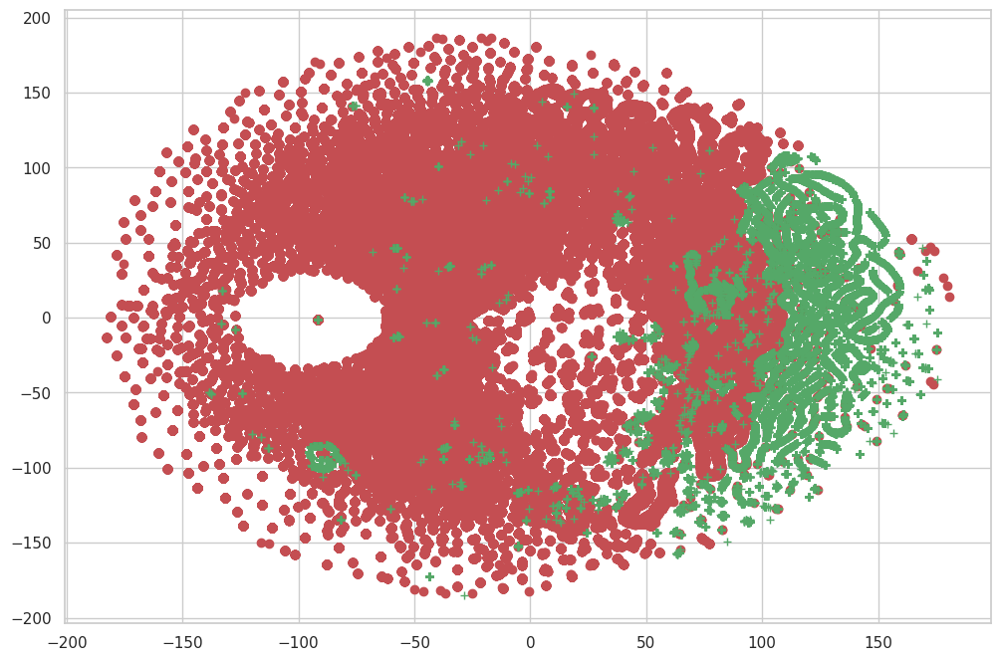

In [ ]:
marks = ('ro', 'g+')

plt.figure(figsize =(12, 8))

y = data['label_encoded']

for n in range(0, 2, 1) :
    projClass = X_transformed[np.equal(y, n*np.ones(y.shape))]
    plt.plot(projClass[0], projClass[1], marks[n])

### 2018 original

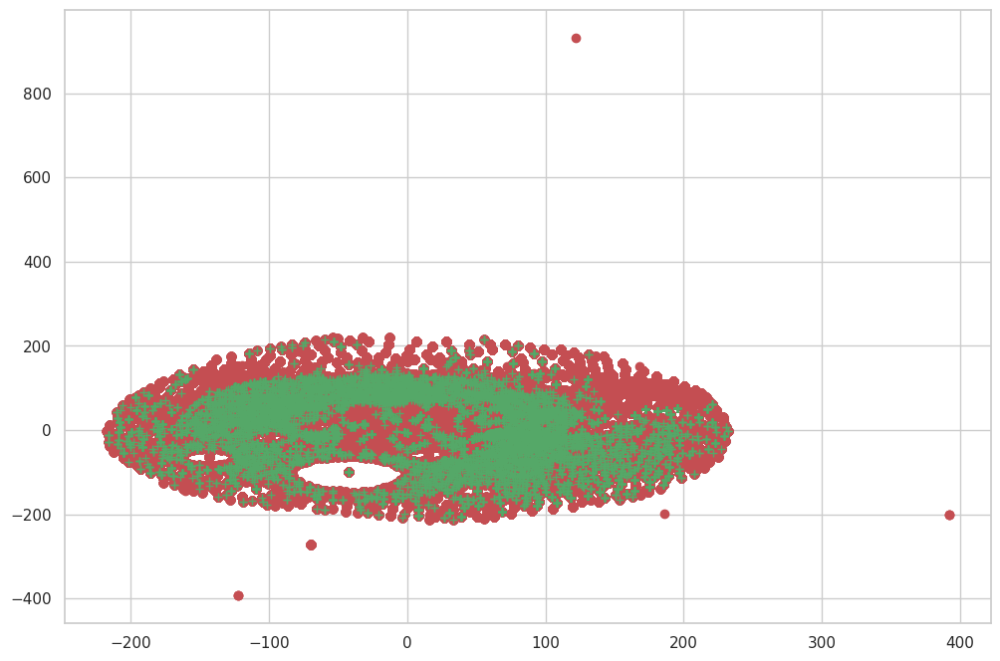

In [ ]:
marks = ('ro', 'g+')

plt.figure(figsize =(12, 8))

y = data['error_rf']

for n in range(0, 2, 1) :
    projClass = X_transformed[np.equal(y, n*np.ones(y.shape))]
    plt.plot(projClass[0], projClass[1], marks[n])

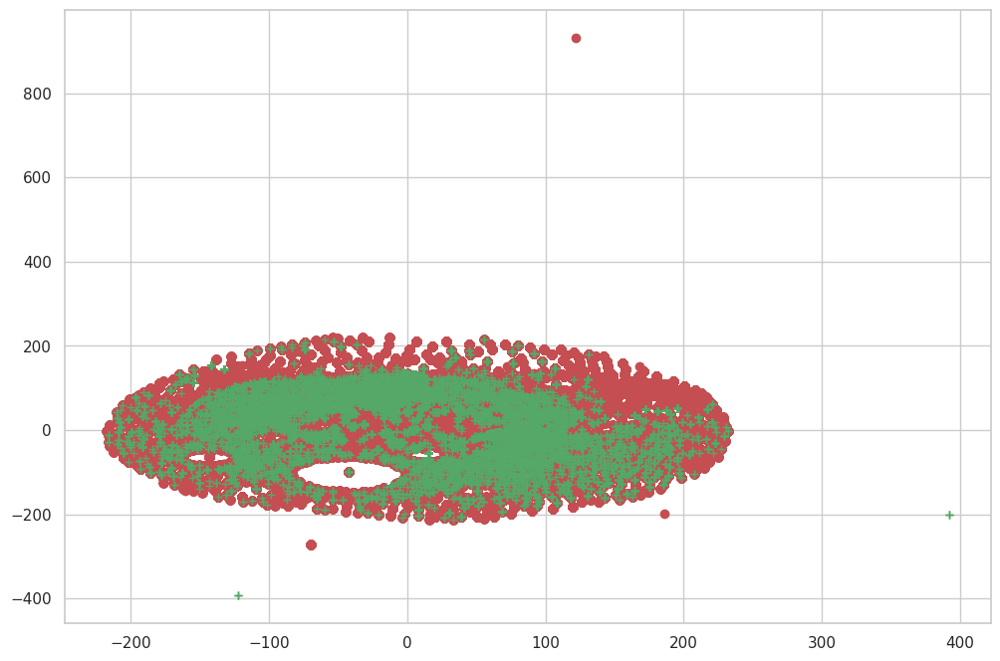

In [ ]:
marks = ('ro', 'g+')

plt.figure(figsize =(12, 8))

y = data['label_encoded']

for n in range(0, 2, 1) :
    projClass = X_transformed[np.equal(y, n*np.ones(y.shape))]
    plt.plot(projClass[0], projClass[1], marks[n])

### 2018 Improved

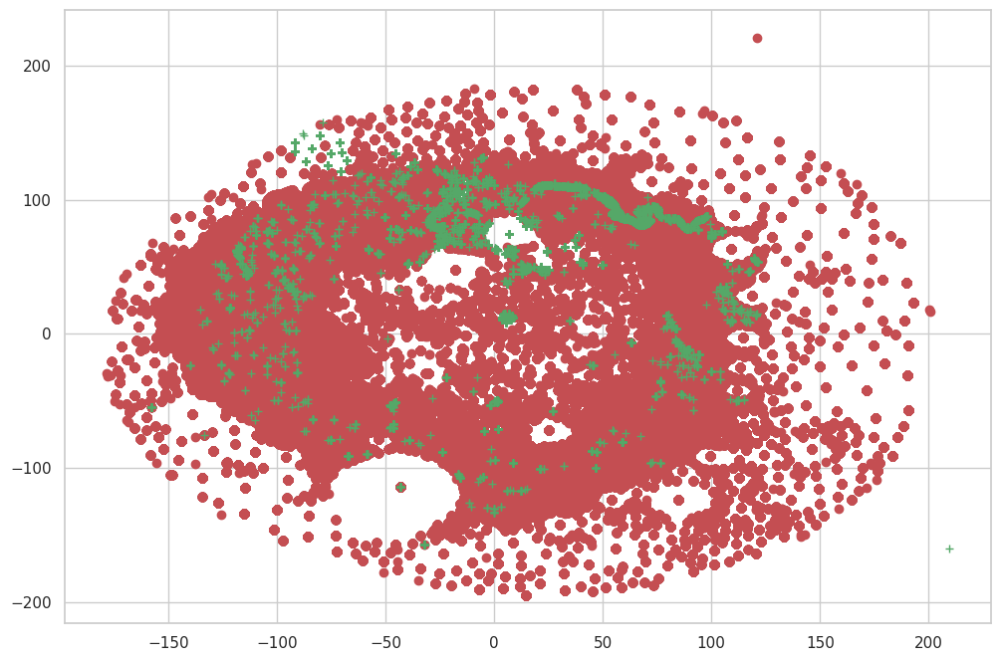

In [26]:
marks = ('ro', 'g+')

plt.figure(figsize =(12, 8))

y = data['error_rf']

for n in range(0, 2, 1) :
    projClass = X_transformed[np.equal(y, n*np.ones(y.shape))]
    plt.plot(projClass[0], projClass[1], marks[n])

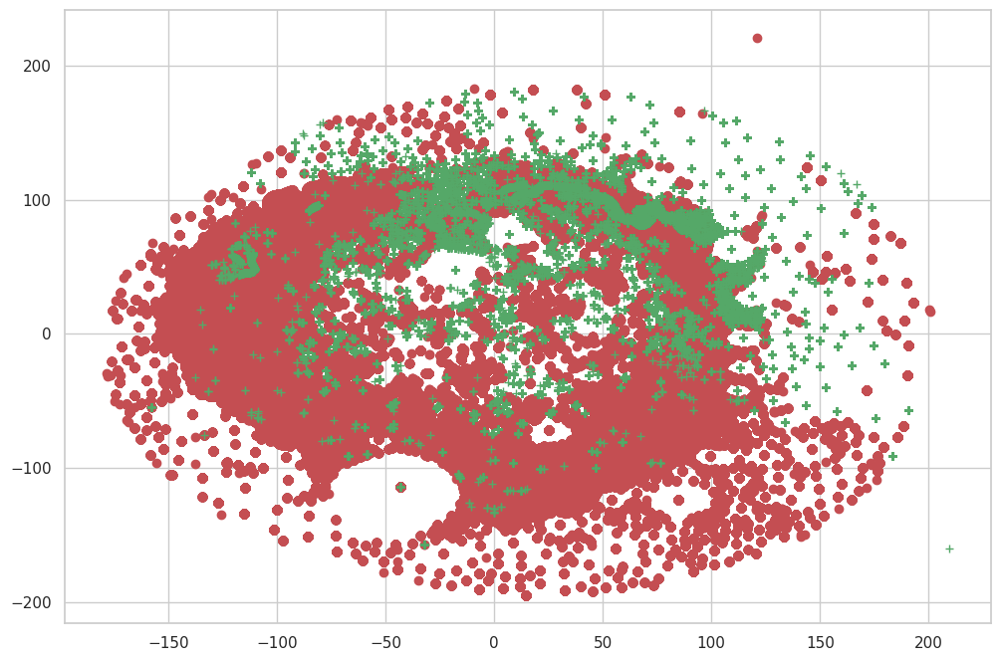

In [27]:
marks = ('ro', 'g+')

plt.figure(figsize =(12, 8))

y = data['label_encoded']

for n in range(0, 2, 1) :
    projClass = X_transformed[np.equal(y, n*np.ones(y.shape))]
    plt.plot(projClass[0], projClass[1], marks[n])

In [ ]:
data_misclassified_rf = data[data['label_encoded'] != data['ypreds_rf']]
data_misclassified_xgb = data[data['label_encoded'] != data['ypreds_xgb']]
data_misclassified_knn = data[data['label_encoded'] != data['ypreds_knn']]
data_corrected_rf = data[data['label_encoded'] == data['ypreds_rf']]
data_corrected_xgb = data[data['label_encoded'] == data['ypreds_xgb']]
data_corrected_knn = data[data['label_encoded'] == data['ypreds_knn']]

In [ ]:
X_data_misclassified_rf = data_misclassified_rf.loc[:, 'Packet Length Std':'Subflow Bwd Bytes']
X_data_misclassified_xgb = data_misclassified_xgb.loc[:, 'Packet Length Std':'Subflow Bwd Bytes']
X_data_misclassified_knn = data_misclassified_knn.loc[:, 'Packet Length Std':'Subflow Bwd Bytes']

X_data_corrected_rf = data_corrected_rf.loc[:, 'Packet Length Std':'Subflow Bwd Bytes']
X_data_corrected_xgb = data_corrected_xgb.loc[:, 'Packet Length Std':'Subflow Bwd Bytes']
X_data_corrected_knn = data_corrected_knn.loc[:, 'Packet Length Std':'Subflow Bwd Bytes']

In [ ]:
X_transformed_misclassified = tsne_plot(X_data_misclassified_rf)
X_transformed_corrected = tsne_plot(X_data_corrected_rf)

### Classified by random forest

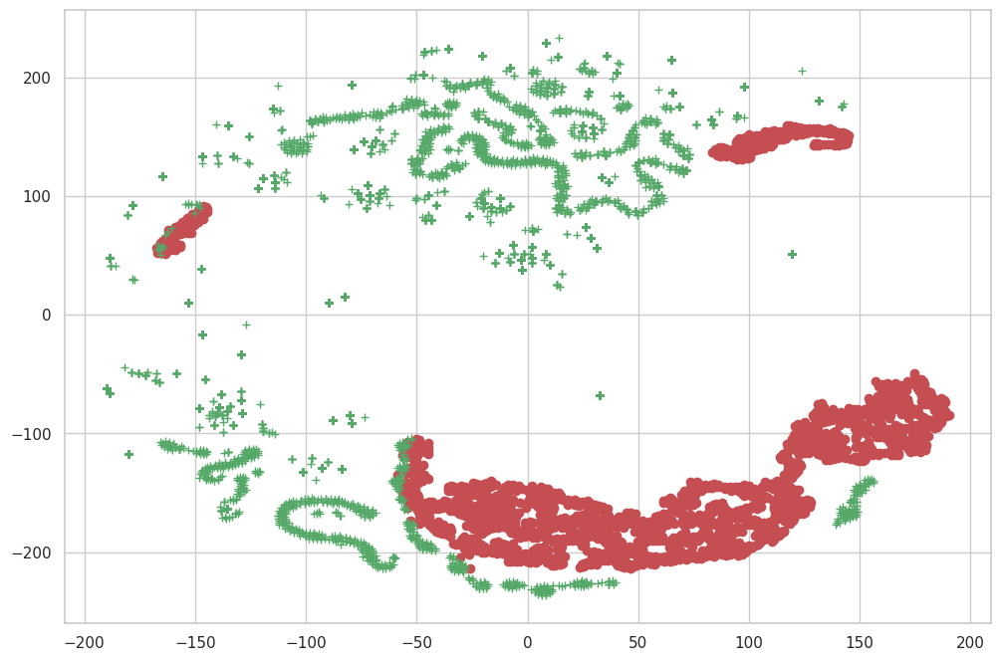

In [ ]:
marks = ('ro', 'g+')

plt.figure(figsize =(12, 8))

y_corrected = data_misclassified_rf['label_encoded']

for n in range(0, 2, 1) :
    projClass = X_transformed_misclassified[np.equal(y_corrected, n*np.ones(y_corrected.shape))]
    plt.plot(projClass[:,0], projClass[:,1], marks[n])

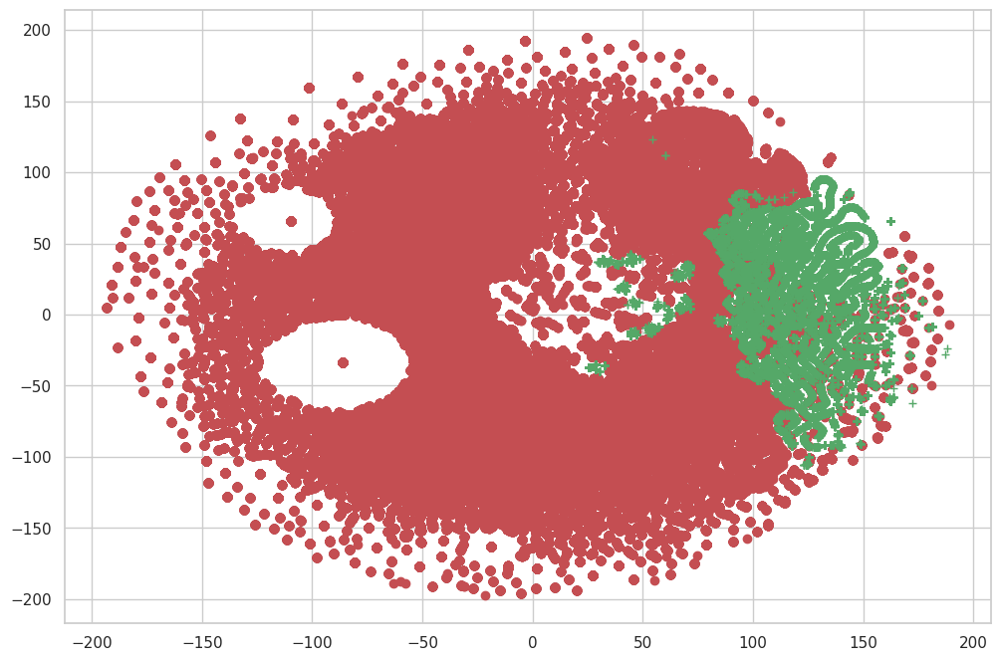

In [ ]:
marks = ('ro', 'g+')

plt.figure(figsize =(12, 8))

y_corrected = data_corrected_rf['label_encoded']

for n in range(0, 2, 1) :
    projClass = X_transformed_corrected[np.equal(y_corrected, n*np.ones(y_corrected.shape))]
    plt.plot(projClass[:,0], projClass[:,1], marks[n])